In [5]:
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from sklearn import utils
from PIL import Image, ImageFile
import os
from keras.losses import Loss
import albumentations
import cv2
import time
import pickle
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
from matplotlib import patches
from collections import Counter

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
cd drive/MyDrive/PASCAL_VOC/images

/content/drive/MyDrive/PASCAL_VOC/images


In [ ]:
!ls

In [2]:
# Include Batch Normalization
# Remove bias because batch normalization
# Use kernel initializer
# Activation is Leaky Relu
# Use batch normalization after the activation
# Learning Rate scheduling?
# Pooling?
# Padding?
# Strides?
# Transfer Learning

In [6]:
def conv_blocks(inputs, ker_size, num_filter, num_strides):
    model = keras.layers.Conv2D(kernel_size=ker_size, kernel_initializer='he_normal', filters=num_filter, padding='same', strides=num_strides, use_bias=False)(inputs)
    model = keras.layers.BatchNormalization(momentum=0.9)(model)
    model = keras.layers.Activation('LeakyReLU')(model)
    return model

In [7]:
def residual_block(inputs, num_filters):
    temp = inputs
    model = conv_blocks(inputs, 1, num_filters, 1)
    model = conv_blocks(model, 3, num_filters * 2, 1)
    model = keras.layers.Add()([model, temp])
    return model

In [8]:
input = keras.layers.Input(shape=(416,416,3))
model = conv_blocks(input, 3, 32, 1)
model = conv_blocks(model, 3, 64, 2)
model = residual_block(model, 32)
model = conv_blocks(model, 3, 128, 2)
for i in range(2):
    model = residual_block(model, 64)
model = conv_blocks(model, 3, 256, 2)
for i in range(8):
    model = residual_block(model, 128)
model_temp_1 = model
model = conv_blocks(model, 3, 512, 2)
for i in range(8):
    model = residual_block(model, 256)
model_temp_2 = model
model = conv_blocks(model, 3, 1024, 2)
for i in range(4):
    model = residual_block(model, 512)
# End of Dark Net 53
model = conv_blocks(model, 1, 512, 1)
model = conv_blocks(model, 3, 1024, 1)
# Going down for the scaled prediction scaling 13 x 13
output_1 = conv_blocks(model, 1, 512, 1)
output_1 = conv_blocks(output_1, 3, 1024, 1)
output_1 = conv_blocks(output_1, 1, 512, 1)
output_1 = conv_blocks(output_1, 3, 1024, 1)
# Final Output 1 
output_1 = keras.layers.Conv2D(kernel_size=1, kernel_initializer='he_normal', filters=75, padding='same', strides=1, name='output_1')(output_1)

# Now going on from model to do scaled prediction 26 x 26
model = conv_blocks(model, 1, 256, 1)
model = keras.layers.UpSampling2D(size=(2,2))(model)
model = keras.layers.Concatenate(axis=3)([model, model_temp_2])
model = conv_blocks(model, 1, 256, 1)
model = conv_blocks(model, 3, 512, 1)
# Going down for the scaled prediction scaling 26 x 26
output_2 = conv_blocks(model, 1, 256, 1)
output_2 = conv_blocks(output_2, 3, 512, 1)
output_2 = conv_blocks(output_2, 1, 256, 1)
output_2 = conv_blocks(output_2, 3, 512, 1)
# Final Output 2
output_2 = keras.layers.Conv2D(kernel_size=1, kernel_initializer='he_normal', filters=75, padding='same', strides=1, name='output_2')(output_2)

model = conv_blocks(model, 1, 128, 1)
model = keras.layers.UpSampling2D(size=(2,2))(model)
model = keras.layers.Concatenate(axis=3)([model, model_temp_1])
model = conv_blocks(model, 1, 128, 1)
model = conv_blocks(model, 3, 256, 1)
# Going down for the scaled prediction scaling 26 x 26
output_3 = conv_blocks(model, 1, 128, 1)
output_3 = conv_blocks(output_3, 3, 256, 1)
output_3 = conv_blocks(output_3, 1, 128, 1)
output_3 = conv_blocks(output_3, 3, 256, 1)
# Final Output 2
output_3 = keras.layers.Conv2D(kernel_size=1, kernel_initializer='he_normal', filters=75, padding='same', strides=1, name='output_3')(output_3)

final_model = keras.models.Model(inputs=[input], outputs=[output_1, output_2, output_3])

In [9]:
final_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 416, 416, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 416, 416, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 416, 416, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
# Each cell can only have one object, will miss some objects and that is why we increase the number of cells to detect all
# of them

In [10]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
# Anchors for the different scales

In [11]:
ANCHORS = [
    [(0.28, 0.22), (0.38, 0.48), (0.9, 0.78)],
    [(0.07, 0.15), (0.15, 0.11), (0.14, 0.29)],
    [(0.02, 0.03), (0.04, 0.07), (0.08, 0.06)],
]

S = [13, 26, 52]

In [ ]:
ANCHORS_tensor = tf.constant(ANCHORS)

S_2 = tf.expand_dims(tf.constant(S), 1)
S_2 = tf.expand_dims(S_2, 1)
S_2 = tf.tile(S_2, (1,3,2))
S_2 = tf.cast(S_2, tf.float32)

scaled_anchors = ANCHORS_tensor * S_2

In [13]:
PASCAL_CLASSES = [
    "aeroplane",
    "bicycle",
    "bird",
    "boat",
    "bottle",
    "bus",
    "car",
    "cat",
    "chair",
    "cow",
    "diningtable",
    "dog",
    "horse",
    "motorbike",
    "person",
    "pottedplant",
    "sheep",
    "sofa",
    "train",
    "tvmonitor"
]

In [ ]:
# IOU Score calculation function

In [14]:
def iou (target, pred, midpoint_type, midpoint = None):
    # pred and target are of shape N, 2 where N is the number batch size
    # box a is for prediction and box b is for the target
    
    if midpoint_type == 'same':
        boxa_x1 = midpoint[0] - (pred[...,0] / 2)
        boxa_x2 = midpoint[0] + (pred[...,0] / 2)
        boxa_y1 = midpoint[1] - (pred[...,1] / 2)
        boxa_y2 = midpoint[1] + (pred[...,1] / 2)
        boxb_x1 = midpoint[0] - (target[...,0] / 2)
        boxb_x2 = midpoint[0] + (target[...,0] / 2)
        boxb_y1 = midpoint[1] - (target[...,1] / 2)
        boxb_y2 = midpoint[1] + (target[...,1] / 2)
        
    if midpoint_type == 'different':
        boxa_x1 = pred[...,0] - (pred[...,2] / 2)
        boxa_x2 = pred[...,0] + (pred[...,2] / 2)
        boxa_y1 = pred[...,1] - (pred[...,3] / 2)
        boxa_y2 = pred[...,1] + (pred[...,3] / 2)
        boxb_x1 = target[...,0] - (target[...,2] / 2)
        boxb_x2 = target[...,0] + (target[...,2] / 2)
        boxb_y1 = target[...,1] - (target[...,3] / 2)
        boxb_y2 = target[...,1] + (target[...,3] / 2)
    
    x1 = tf.maximum(boxa_x1, boxb_x1)
    x2 = tf.minimum(boxa_x2, boxb_x2)
    y1 = tf.maximum(boxa_y1, boxb_y1)
    y2 = tf.minimum(boxa_y2, boxb_y2)
    
    intersection_area = tf.clip_by_value((x2 - x1), clip_value_min=0, clip_value_max=(x2 - x1)) * tf.clip_by_value((y2 - y1), clip_value_min=0, clip_value_max=(y2 - y1))
    
    boxa_area = abs((boxa_x1 - boxa_x2) * (boxa_y1 - boxa_y2))
    boxb_area = abs((boxb_x1 - boxb_x2) * (boxa_y1 - boxb_y2))
    
    iou_score = intersection_area / (boxa_area + boxb_area - intersection_area + 1e-10)

    return iou_score

In [ ]:
# Loading the dataset

In [ ]:
# The first Data Generator that I implemented. I then modified it and created another one which is below this.
class DataGenerator (keras.utils.Sequence):
    def __init__(
        self,
        csv_file,
        img_dir,
        label_dir,
        anchors,
        image_size=416,
        S=[13, 26, 52],
        C=20,
        batch_size=32
    ):
        self.annotations = pd.read_csv(csv_file)
        self.batch_size = batch_size
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.image_size = image_size
        self.S = S
        self.anchors = tf.constant(anchors[0] + anchors[1] + anchors[2])  # for all 3 scales
        self.num_anchors = self.anchors.shape[0]
        self.num_anchors_per_scale = self.num_anchors // 3
        self.C = C
        self.ignore_iou_thresh = 0.5
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.annotations) / self.batch_size))
    
    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.annotations))

    def __getitem__(self, index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        annotation_list_temp = [self.annotations.iloc[k,:] for k in indexes]
        
        # Image batch will be stored in this.
        X = tf.Variable(tf.zeros((self.batch_size, self.image_size, self.image_size, 3), dtype=np.float32), dtype=tf.float32)
        Y = {'output_1': [],
            'output_2': [],
            'output_3': []}
        
        for index, data in enumerate(annotation_list_temp):
            label_path = os.path.join(self.label_dir, data[1])
            bboxes = np.roll(np.loadtxt(fname=label_path, delimiter=" ", ndmin=2), 4, axis=1).tolist()
            img_path = os.path.join(self.img_dir, data[0])
            image = np.array(Image.open(img_path).convert("RGB"))

            # apply resizing with albumentations
            transform_1 = albumentations.Compose([albumentations.augmentations.geometric.resize.LongestMaxSize(max_size=416),
                                                  albumentations.augmentations.transforms.PadIfNeeded(min_height=416, min_width=416,
                                                                                      border_mode=cv2.BORDER_CONSTANT)],
                                                 bbox_params=albumentations.BboxParams(format='yolo', label_fields=[]))
            
            transform_2 = albumentations.Compose([albumentations.augmentations.transforms.PadIfNeeded(min_height=416, min_width=416,
                                                                                      border_mode=cv2.BORDER_CONSTANT)],
                                                bbox_params=albumentations.BboxParams(format='yolo', label_fields=[]))

            if image.shape[0] < 416 and image.shape[1] < 416:
                resized = transform_2(image=image, bboxes=bboxes)
            else:
                resized = transform_1(image=image, bboxes=bboxes)
            
            image = resized["image"]
            image = tf.constant(image / 255.0, dtype=tf.float32)
            bboxes = resized["bboxes"]

            # Building the targets below:
            # Below assumes 3 scale predictions (as paper) and same num of anchors per scale
            targets = [tf.Variable(tf.zeros((self.num_anchors // 3, S, S, 6),dtype=tf.float32), dtype=tf.float32) for S in self.S]
            for box in bboxes:
                iou_anchors = iou(tf.constant(box[2:4], dtype=tf.float32), self.anchors, 'same', tf.constant(box[0:2], dtype=tf.float32))
                anchor_indices = tf.argsort(iou_anchors, direction='DESCENDING', axis=0)
                x, y, width, height, class_label = box
                has_anchor = [False] * 3  # each scale should have one anchor for each object that detected
                for anchor_idx in anchor_indices:
                    scale_idx = anchor_idx // self.num_anchors_per_scale
                    anchor_on_scale = anchor_idx % self.num_anchors_per_scale
                    S = self.S[scale_idx]
                    i, j = int(S * y), int(S * x)  # which cell
                    anchor_taken = targets[scale_idx][anchor_on_scale, i, j, 0]
                    if not anchor_taken and not has_anchor[scale_idx]:
                        targets[scale_idx][anchor_on_scale, i, j, 0].assign(1)
                        x_cell, y_cell = S * x - j, S * y - i  # both between [0,1]
                        width_cell, height_cell = (
                            width * S,
                            height * S,
                        )  # can be greater than 1 since it's relative to cell
                        box_coordinates = tf.constant([x_cell, y_cell, width_cell, height_cell], dtype=tf.float32)
                        targets[scale_idx][anchor_on_scale, i, j, 1:5].assign(box_coordinates)
                        targets[scale_idx][anchor_on_scale, i, j, 5].assign(int(class_label))
                        has_anchor[scale_idx] = True

                    elif not anchor_taken and iou_anchors[anchor_idx] > self.ignore_iou_thresh:
                        targets[scale_idx][anchor_on_scale, i, j, 0].assign(-1)  # ignore prediction

            X[index,].assign(image)
            Y['output_1'].append(targets[0])
            Y['output_2'].append(targets[1])
            Y['output_3'].append(targets[2])

        return X, Y

In [15]:
# The second Data Generator that I used.
class DataGenerator_New (keras.utils.Sequence):
    def __init__(
        self,
        csv_file,
        img_dir,
        label_dir,
        anchors,
        image_size=416,
        S=[13, 26, 52],
        C=20,
        batch_size=32
    ):
        self.annotations = pd.read_csv(csv_file)
        self.batch_size = batch_size
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.image_size = image_size
        self.S = S
        self.anchors = tf.constant(anchors[0] + anchors[1] + anchors[2])  # for all 3 scales
        self.num_anchors = self.anchors.shape[0]
        self.num_anchors_per_scale = self.num_anchors // 3
        self.C = C
        self.ignore_iou_thresh = 0.5
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.annotations) / self.batch_size))
    
    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.annotations))

    def __getitem__(self, index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        annotation_list_temp = [self.annotations.iloc[k,:] for k in indexes]
        
        # Image batch will be stored in this.
        X = tf.Variable(tf.zeros((self.batch_size, self.image_size, self.image_size, 3), dtype=np.float32), dtype=tf.float32)
        Y = {'output_1': [],
            'output_2': [],
            'output_3': []}
        
        for index, data in enumerate(annotation_list_temp):
            label_path = os.path.join(self.label_dir, data[1])
            bboxes = np.roll(np.loadtxt(fname=label_path, delimiter=" ", ndmin=2), 4, axis=1).tolist()
            img_path = os.path.join(self.img_dir, data[0])
            image = np.array(Image.open(img_path).convert("RGB"))

            transform = albumentations.Compose([albumentations.Resize(416,416,always_apply=True, p=1)],
                                  bbox_params=albumentations.BboxParams(format='yolo', label_fields=[]))
            
            resized = transform(image=image, bboxes=bboxes)
            
            image = resized["image"]
            image = tf.constant(image / 255.0, dtype=tf.float32)
            bboxes = resized["bboxes"]

            # Building the targets below:
            targets = [tf.Variable(tf.zeros((self.num_anchors // 3, S, S, 6),dtype=tf.float32), dtype=tf.float32) for S in self.S]
            for box in bboxes:
                iou_anchors = iou(tf.constant(box[2:4], dtype=tf.float32), self.anchors, 'same', tf.constant(box[0:2], dtype=tf.float32))
                anchor_indices = tf.argsort(iou_anchors, direction='DESCENDING', axis=0)
                x, y, width, height, class_label = box
                anchor_selected = False
                for anch in anchor_indices:
                  if not anchor_selected and iou_anchors[anch] >= 0.5:
                    scale_idx = anch // self.num_anchors_per_scale
                    anchor_on_scale = anch % self.num_anchors_per_scale
                    S = self.S[scale_idx]
                    i, j = int(S * y), int(S * x)  # which cell
                    anchor_taken = targets[scale_idx][anchor_on_scale, i, j, 0]

                    if anchor_taken != 1:
                      targets[scale_idx][anchor_on_scale, i, j, 0].assign(1)
                      x_cell, y_cell = S * x - j, S * y - i  # both between [0,1]
                      width_cell, height_cell = (width * S, height * S,)  # can be greater than 1 since it's relative to cell
                      box_coordinates = tf.constant([x_cell, y_cell, width_cell, height_cell], dtype=tf.float32)
                      targets[scale_idx][anchor_on_scale, i, j, 1:5].assign(box_coordinates)
                      targets[scale_idx][anchor_on_scale, i, j, 5].assign(int(class_label))
                      anchor_selected = True
                
                filter = iou_anchors > 0.5
                for i_2 in range(len(filter)):
                  if filter[i_2]:
                    new_scale_index = i_2 // self.num_anchors_per_scale
                    new_anchor_index = i_2 % self.num_anchors_per_scale
                    S = self.S[new_scale_index]
                    i, j = int(S * y), int(S * x)
                    if targets[new_scale_index][new_anchor_index, i, j, 0] == 0:
                      targets[new_scale_index][new_anchor_index, i, j, 0].assign(-1)

            X[index,].assign(image)
            Y['output_1'].append(targets[0])
            Y['output_2'].append(targets[1])
            Y['output_3'].append(targets[2])

        return X, Y

In [ ]:
test_data = DataGenerator_New(csv_file="/content/drive/MyDrive/PASCAL_VOC/test.csv",
                          img_dir="/content/drive/MyDrive/PASCAL_VOC/images",
                          label_dir="/content/drive/MyDrive/PASCAL_VOC/labels",
                          anchors=ANCHORS)

In [37]:
train_data = DataGenerator_New(csv_file="/content/drive/MyDrive/PASCAL_VOC/100examples.csv",
                          img_dir="/content/drive/MyDrive/PASCAL_VOC/images",
                          label_dir="/content/drive/MyDrive/PASCAL_VOC/labels",
                          anchors=ANCHORS)

In [ ]:
# Creating the loss function

In [17]:
class YOLO_Loss_Function(Loss):
    
    def __init__(self, anchors):
        super().__init__()
        self.anchors = anchors
    
    def call(self, true_val, pred_val):
        # resizing predicted value and saving it into temp_val
        true_val = tf.convert_to_tensor(true_val, dtype=tf.float32)
        pred_val = tf.convert_to_tensor(pred_val, dtype=tf.float32)
        temp_val = tf.transpose(tf.reshape(pred_val, (32, true_val.shape[2], true_val.shape[2], 3, 25)), perm=[0, 3, 2, 1, 4])
        
        objects = true_val[...,0] == 1
        no_objects = true_val[...,0] == 0

        # No object loss
        bce = keras.losses.BinaryCrossentropy(from_logits=True)
        loss_no_object = bce(true_val[...,0][no_objects], temp_val[...,0][no_objects])

        # Object Loss
        anchs = tf.reshape(self.anchors, (1, 3, 1, 1, 2))
        box_predictions = tf.concat([tf.math.sigmoid(temp_val[..., 1:3]), tf.math.exp(temp_val[..., 3:5]) * anchs], axis=-1)
        ious = iou(box_predictions[objects], true_val[..., 1:5][objects], 'different')
        loss_object = bce((ious * true_val[..., 0:1][objects]), (temp_val[..., 0:1][objects]))

        # Box Loss
        temp_1 = tf.concat([tf.math.sigmoid(temp_val[..., 1:3]), temp_val[..., 3:5]], axis=-1)
        temp_2 = tf.concat([true_val[..., 1:3], tf.math.log((1e-16 + true_val[..., 3:5] / anchs))], axis=-1)
        # compute mse loss for boxes
        mse = keras.losses.MeanSquaredError()
        loss_box = mse(temp_2[objects], temp_1[objects])

        # Classification Loss
        scce = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        loss_class = scce((true_val[..., 5][objects]), (temp_val[..., 5:][objects]))
        
        total_loss = loss_no_object + loss_object + loss_box + loss_class
        
        return total_loss

In [18]:
# These two function are used to save and load the model and the optimizer weights
def save_optimizer_state(optimizer, save_path, save_name):
    '''
    Save keras.optimizers object state.

    Arguments:
    optimizer --- Optimizer object.
    save_path --- Path to save location.
    save_name --- Name of the .npy file to be created.

    '''

    # Create folder if it does not exists
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    
    # save weights
    np.save(os.path.join(save_path, save_name), optimizer.get_weights())

    return

def load_optimizer_state(optimizer, load_path, load_name, model_train_vars):
    '''
    Loads keras.optimizers object state.

    Arguments:
    optimizer --- Optimizer object to be loaded.
    load_path --- Path to save location.
    load_name --- Name of the .npy file to be read.
    model_train_vars --- List of model variables (obtained using Model.trainable_variables)

    '''

    # Load optimizer weights
    opt_weights = np.load(os.path.join(load_path, load_name)+'.npy', allow_pickle=True)

    # dummy zero gradients
    zero_grads = [tf.zeros_like(w) for w in model_train_vars]
    # save current state of variables
    saved_vars = [tf.identity(w) for w in model_train_vars]

    # Apply gradients which don't do nothing with Adam
    optimizer.apply_gradients(zip(zero_grads, model_train_vars))

    # Reload variables
    [x.assign(y) for x,y in zip(model_train_vars, saved_vars)]

    # Set the weights of the optimizer
    optimizer.set_weights(opt_weights)
    
    return

In [19]:
# Initializing the variables
loss_fn_1 = YOLO_Loss_Function(scaled_anchors[0])
loss_fn_2 = YOLO_Loss_Function(scaled_anchors[1])
loss_fn_3 = YOLO_Loss_Function(scaled_anchors[2])
optimizer = keras.optimizers.Adam(learning_rate=1e-4)
batch_size = 32

In [20]:
# Always check that the correct file is loaded
# Steps to Load:
# 1) Dowload the epoch weights and epoch optimizer weights
# 2) Load the Weights that were downloaded, check path MUST!!
final_model.load_weights('/content/drive/MyDrive/CS_767_Semester_Project/Model_Weights/Epochs_New/Model_Train_Weights_1')

load_path = '/content/drive/MyDrive/CS_767_Semester_Project/Optimizer_Weights/Epochs_New'
load_name = 'adam_weights_1'
model_train_vars = final_model.trainable_variables

load_optimizer_state(optimizer, load_path, load_name, model_train_vars)

In [21]:
final_model.trainable=False

In [18]:
# Training Function
@tf.function
def train_step(x, y):
    with tf.GradientTape() as tape:
        logits = final_model(x, training=True)
        y0 = y['output_1']
        y1 = y['output_2']
        y2 = y['output_3']
        loss_value = loss_fn_1(y0, logits[0], scaled_anchors[0]) + loss_fn_2(y1, logits[1], scaled_anchors[1]) + loss_fn_3(y2, logits[2], scaled_anchors[2])
    
    grads = tape.gradient(loss_value, final_model.trainable_weights)
    optimizer.apply_gradients(zip(grads, final_model.trainable_weights))
    return loss_value

In [19]:
# Training Loop
epochs = 100
for epoch in range(epochs):
    print("\nStart of epoch %d" % (epoch,))
    start_time = time.time()

    # Iterate over the batches of the dataset.
    for step, (x_batch_train, y_batch_train) in enumerate(train_data):
        loss_value = train_step(x_batch_train, y_batch_train)

        print("Training loss (for one batch) at step %d: %.4f" % (step, float(loss_value)))
        print("Seen so far: %d samples" % ((step + 1) * batch_size))

        if step % 100 == 0 and step > 0:
            final_model.save_weights('/content/drive/MyDrive/CS_767_Semester_Project/Model_Weights/Model_Train_Weights_' + str(epoch) + '_' + str(step), overwrite=True)
            save_name = 'adam_weights_' + str(epoch) + '_' + str(step) + '.npy'
            save_optimizer_state(optimizer, '/content/drive/MyDrive/CS_767_Semester_Project/Optimizer_Weights', save_name)

final_model.save_weights('/content/drive/MyDrive/CS_767_Semester_Project/100examples/Model_100_Weights_' + str(epoch), overwrite=True)
save_name = 'adam_weights_model_100' + '.npy'
save_optimizer_state(optimizer, '/content/drive/MyDrive/CS_767_Semester_Project/100examples', save_name)


Start of epoch 0
Tensor("YOLO_Loss_Function/packed:0", shape=(32, 3, 13, 13, 6), dtype=float32)
Tensor("model/output_1/BiasAdd:0", shape=(32, 13, 13, 75), dtype=float32)
Tensor("YOLO_Loss_Function/transpose:0", shape=(32, 3, 13, 13, 25), dtype=float32)
Tensor("YOLO_Loss_Function_1/packed:0", shape=(32, 3, 26, 26, 6), dtype=float32)
Tensor("model/output_2/BiasAdd:0", shape=(32, 26, 26, 75), dtype=float32)
Tensor("YOLO_Loss_Function_1/transpose:0", shape=(32, 3, 26, 26, 25), dtype=float32)
Tensor("YOLO_Loss_Function_2/packed:0", shape=(32, 3, 52, 52, 6), dtype=float32)
Tensor("model/output_3/BiasAdd:0", shape=(32, 52, 52, 75), dtype=float32)
Tensor("YOLO_Loss_Function_2/transpose:0", shape=(32, 3, 52, 52, 25), dtype=float32)
Tensor("YOLO_Loss_Function/packed:0", shape=(32, 3, 13, 13, 6), dtype=float32)
Tensor("model/output_1/BiasAdd:0", shape=(32, 13, 13, 75), dtype=float32)
Tensor("YOLO_Loss_Function/transpose:0", shape=(32, 3, 13, 13, 25), dtype=float32)
Tensor("YOLO_Loss_Function_1/p

/usr/local/lib/python3.7/dist-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [30]:
# Function to convert the predictions to bounding boxes relative to the entire image
def cells_to_bboxes(predictions, anchors, S, is_preds=True):

    BATCH_SIZE = predictions.shape[0]
    num_anchors = len(anchors)

    if is_preds:
      preds = tf.transpose(tf.reshape(predictions, (32, S, S, 3, 25)), perm=[0, 3, 2, 1, 4])
      box_predictions = preds[..., 1:5]
      anchors = tf.reshape(anchors, (1, len(anchors), 1, 1, 2))
      a = tf.math.sigmoid(box_predictions[..., 0:2])
      b = tf.math.exp(box_predictions[..., 2:]) * anchors
      scores = tf.math.sigmoid(preds[..., 0:1])
      best_class = tf.expand_dims(tf.math.argmax(preds[..., 5:], axis=-1), -1)
    else:
      box_predictions = predictions
      a = box_predictions[..., 1:3]
      b = box_predictions[..., 3:5]
      scores = box_predictions[..., 0:1]
      best_class = box_predictions[..., 5:6]

    cell_indices = tf.cast(tf.expand_dims(tf.reshape(tf.repeat(tf.reshape(tf.range(S),(1,S)), repeats=[predictions.shape[0] * 3 * S], axis = 0), (predictions.shape[0],3,S,S)), axis=-1), dtype=tf.float32)
    x = (1 / tf.cast(S, dtype=tf.float32)) * (a[..., 0:1] + cell_indices)
    y = (1 / tf.cast(S, dtype=tf.float32)) * (a[..., 1:2] + tf.transpose(cell_indices, perm=[0, 1, 3, 2, 4]))
    w_h = (1 / tf.cast(S, dtype=tf.float32)) * b[..., 0:2]
    converted_bboxes = tf.reshape(tf.concat([tf.cast(best_class, dtype=tf.float32), scores, x, y, w_h], axis=-1), (BATCH_SIZE, num_anchors * S * S, 6))
    return converted_bboxes.tolist()

In [29]:
# Function to perform non max suppression on the images
def non_max_suppression(bboxes, iou_threshold, threshold, box_format="different"):

    assert type(bboxes) == list

    bboxes = [box for box in bboxes if box[1] > threshold]
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)
    bboxes_after_nms = []

    while bboxes:
        chosen_box = bboxes.pop(0)

        bboxes = [
            box
            for box in bboxes
            if box[0] != chosen_box[0]
            or iou(tf.constant(chosen_box[2:], dtype=tf.float32), tf.constant(box[2:], dtype=tf.float32), midpoint_type=box_format) < iou_threshold]

        bboxes_after_nms.append(chosen_box)

    return bboxes_after_nms

In [31]:
# Function to plot the predicted output images
def plot_image(image, boxes=None):
    
    cmap = plt.get_cmap("tab20b")
    class_labels = PASCAL_CLASSES
    colors = [cmap(i) for i in np.linspace(0, 1, len(class_labels))]
    im = image
    height, width, _ = im.shape

    # Create figure and axes
    fig, ax = plt.subplots(1)
    # Display the image
    ax.imshow(im)

    # box[0] is x midpoint, box[2] is width
    # box[1] is y midpoint, box[3] is height

    # Create a Rectangle patch
    for box in boxes:
        assert len(box) == 6, "box should contain class pred, confidence, x, y, width, height"
        class_pred = box[0]
        box = box[2:]
        upper_left_x = box[0] - box[2] / 2
        upper_left_y = box[1] - box[3] / 2
        rect = patches.Rectangle(
            (upper_left_x * width, upper_left_y * height),
            box[2] * width,
            box[3] * height,
            linewidth=2,
            edgecolor=colors[int(class_pred)],
            facecolor="none",
        )
        # Add the patch to the Axes
        ax.add_patch(rect)
        plt.text(
            upper_left_x * width,
            upper_left_y * height,
            s=class_labels[int(class_pred)],
            color="white",
            verticalalignment="top",
            bbox={"color": colors[int(class_pred)], "pad": 0},
        )

    plt.show()

In [25]:
# Test Function to predict output
@tf.function

def test_step(x, y):
  test_logits = final_model(x, training=False)
  return test_logits

In [26]:
# Function in which we predict the output then call the cell to boxes function defined above and then do non max suppression
# The output of this function is then used to calculate the MAP score
def get_evaluation_bboxes(
    test_data_loader,
    model,
    iou_threshold,
    scaled_anchors,
    threshold,
    box_format="different"
):
    train_idx = 0
    all_pred_boxes = []
    all_true_boxes = []
    for batch_idx, (x, labels) in enumerate(test_data_loader):
      predictions = test_step(x, labels)

      batch_size = x.shape[0]
      bboxes = [[] for _ in range(batch_size)]
      true_bboxes = [[] for _ in range(batch_size)]
      for i in range(3):
          index = 'output_' + str(i+1) 
          boxes_scale_i = cells_to_bboxes(predictions[i], scaled_anchors[i], S=S[i], is_preds=True)
          true_boxes = cells_to_bboxes(tf.convert_to_tensor(labels[index], dtype=tf.float32), scaled_anchors[i], S=S[i], is_preds=False)
          for idx, (box) in enumerate(boxes_scale_i):
            bboxes[idx] += box
          for idx, (box) in enumerate(true_boxes):
            true_bboxes[idx] += box

      for idx in range(batch_size):
          nms_boxes = non_max_suppression(
              bboxes[idx],
              iou_threshold=iou_threshold,
              threshold=threshold,
              box_format=box_format,
          )

          for nms_box in nms_boxes:
              all_pred_boxes.append([train_idx] + nms_box)

          for box in true_bboxes[idx]:
              if box[1] > threshold:
                  all_true_boxes.append([train_idx] + box)

          train_idx += 1

    return all_pred_boxes, all_true_boxes

In [32]:
# The function used to calculate the MAP score.
def mean_average_precision(pred_boxes, true_boxes, iou_threshold=0.5, box_format="different", num_classes=20):

    # list storing all AP for respective classes
    average_precisions = []
    epsilon = 1e-6

    for c in range(num_classes):
        detections = []
        ground_truths = []

        # Only selecting bounding boxes taht belong to the particular class.
        for detection in pred_boxes:
            if detection[1] == c:
                detections.append(detection)

        for true_box in true_boxes:
            if true_box[1] == c:
                ground_truths.append(true_box)

        # Find the number of bboxes for each training example
        amount_bboxes = Counter([gt[0] for gt in ground_truths])

        for key, val in amount_bboxes.items():
            amount_bboxes[key] = np.zeros(val, dtype=np.float32)

        # Sorting by box probabilities
        detections.sort(key=lambda x: x[2], reverse=True)
        TP = np.zeros((len(detections)), dtype=np.float32)
        FP = np.zeros((len(detections)), dtype=np.float32)
        total_true_bboxes = len(ground_truths)

        if total_true_bboxes == 0:
            continue

        for detection_idx, detection in enumerate(detections):

            ground_truth_img = [
                bbox for bbox in ground_truths if bbox[0] == detection[0]
            ]

            num_gts = len(ground_truth_img)
            best_iou = 0

            for idx, gt in enumerate(ground_truth_img):
                iou_calc = iou(
                    tf.convert_to_tensor(detection[3:], dtype=tf.float32),
                    tf.convert_to_tensor(gt[3:], dtype=tf.float32),
                    box_format,
                )

                if iou_calc > best_iou:
                    best_iou = iou_calc
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                if amount_bboxes[detection[0]][best_gt_idx] == 0:
                    TP[detection_idx] = 1
                    amount_bboxes[detection[0]][best_gt_idx] = 1
                else:
                    FP[detection_idx] = 1

            # if IOU is lower then the detection is a false positive
            else:
                FP[detection_idx] = 1

        TP_cumsum = np.cumsum(TP, axis=0, dtype=np.float32)
        FP_cumsum = np.cumsum(FP, axis=0, dtype=np.float32)
        recalls = TP_cumsum / (total_true_bboxes + epsilon)
        precisions = TP_cumsum / (TP_cumsum + FP_cumsum + epsilon)
        precisions = np.concatenate((np.array([1], dtype=np.float32), precisions))
        recalls = np.concatenate((np.array([0], dtype=np.float32), recalls))
        average_precisions.append(np.trapz(precisions, recalls))

    return sum(average_precisions) / len(average_precisions)

In [53]:
pred_box, true_box = get_evaluation_bboxes(trail_data, final_model, 0.45, scaled_anchors, 0.6, "different")

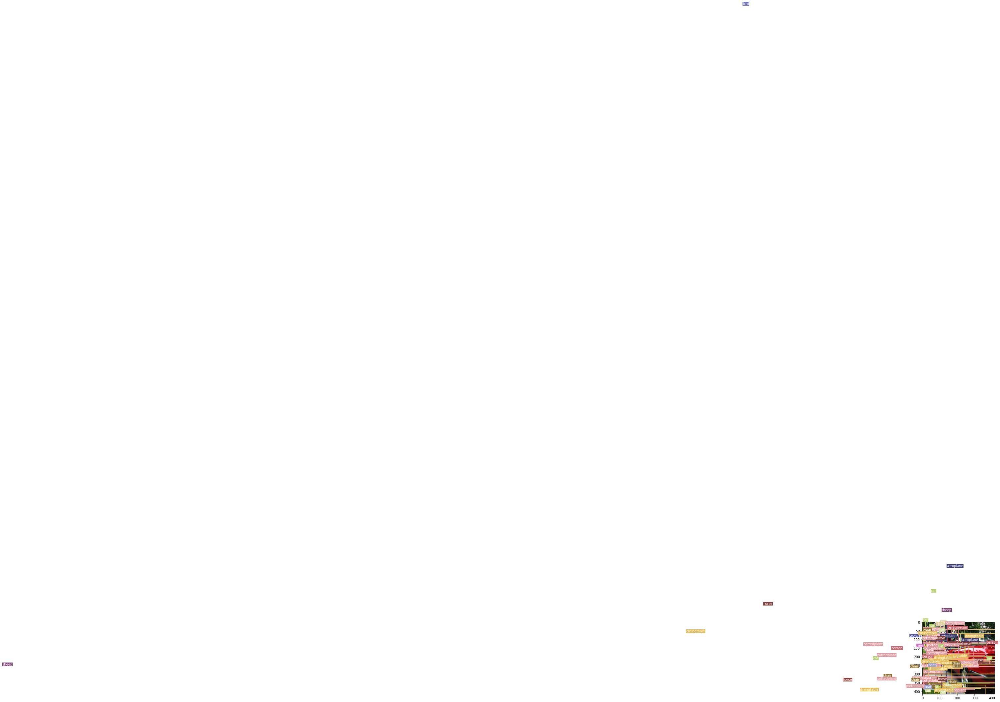

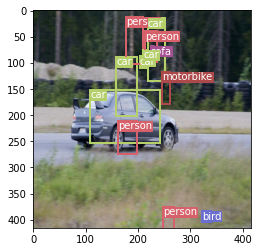

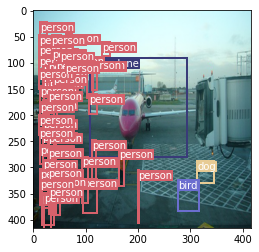

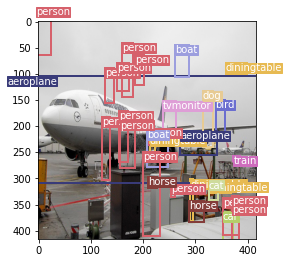

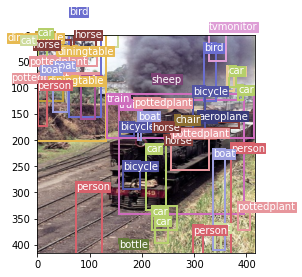

...

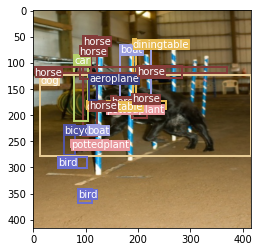

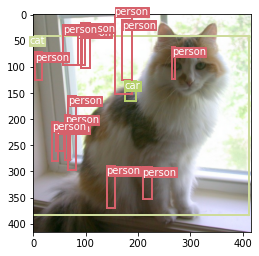

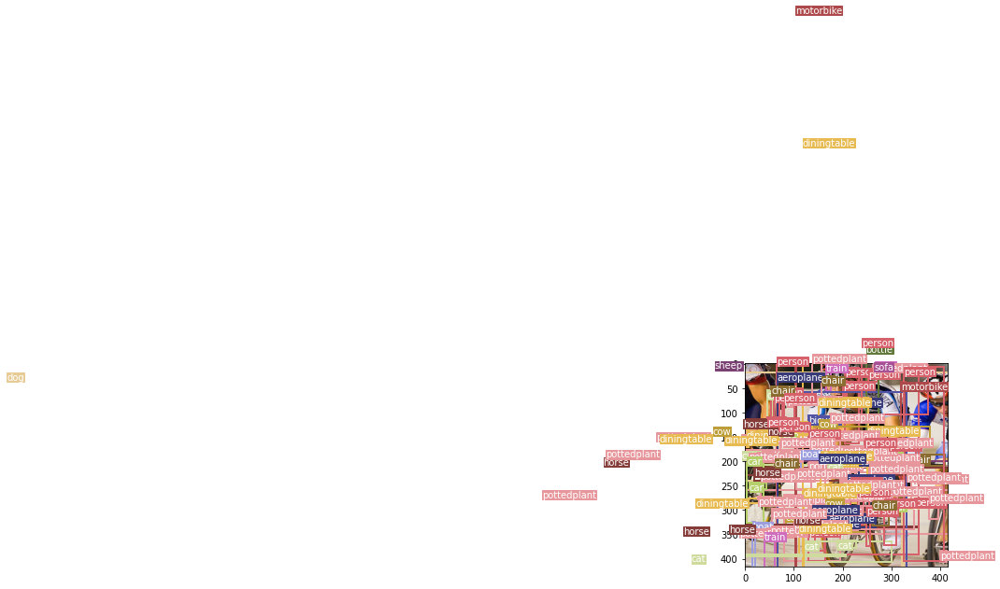

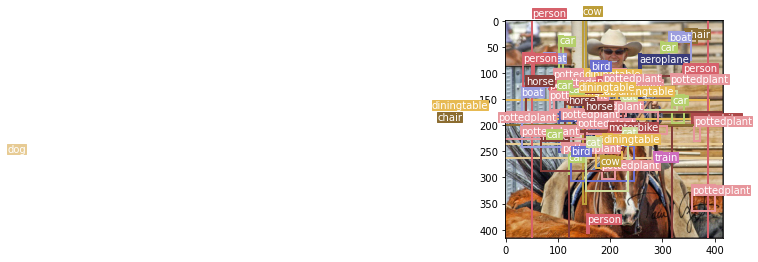

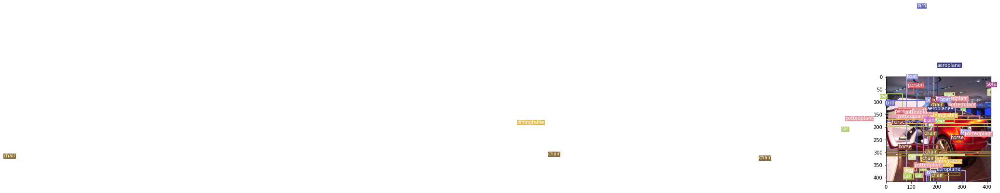

ValueError: ignored

<Figure size 432x288 with 1 Axes>

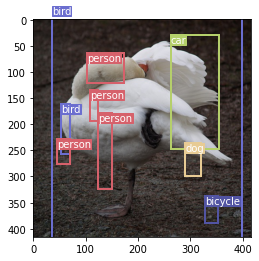

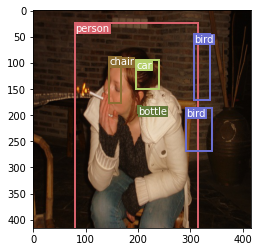

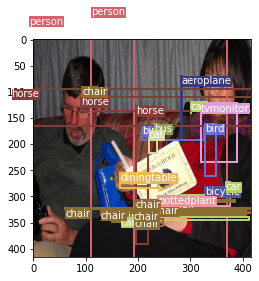

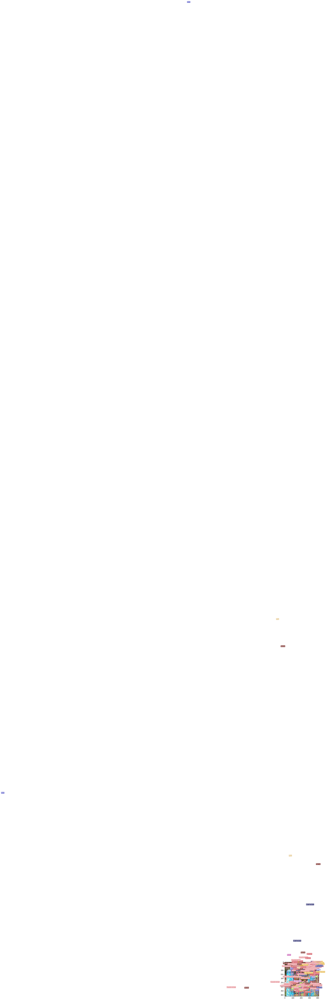

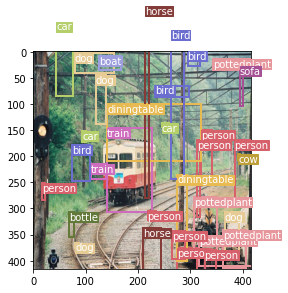

...

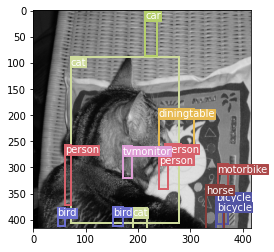

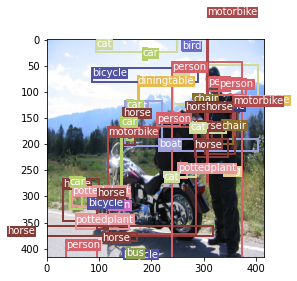

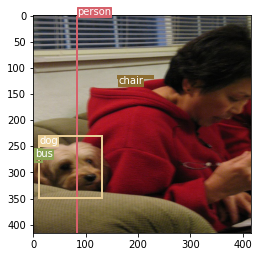

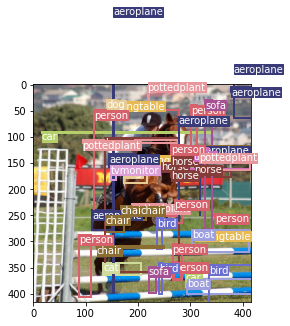

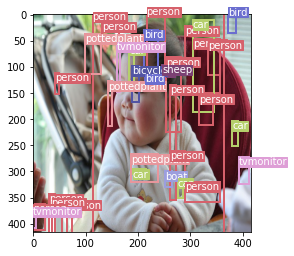

ValueError: ignored

<Figure size 432x288 with 1 Axes>

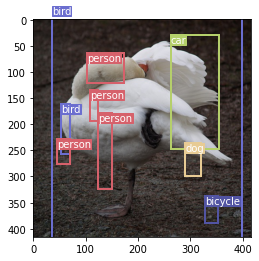

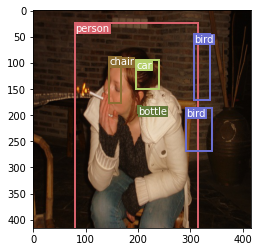

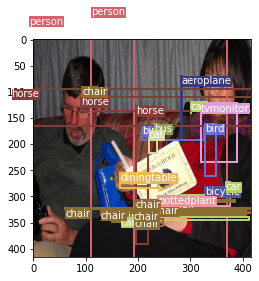

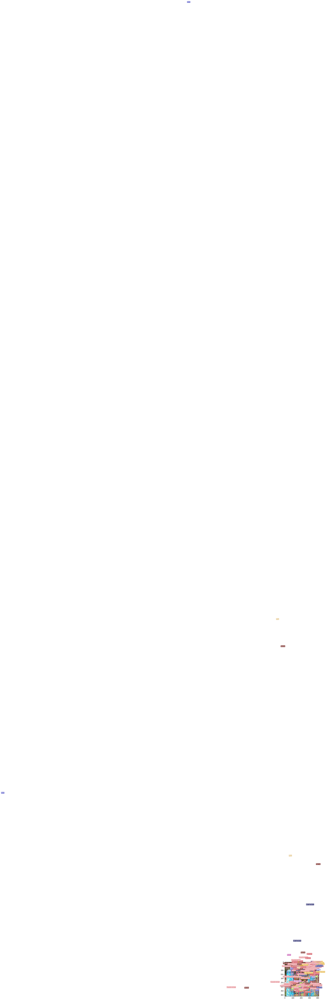

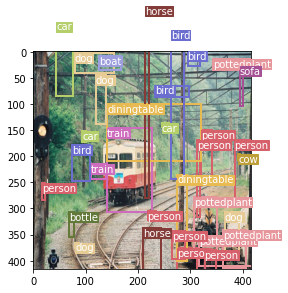

...

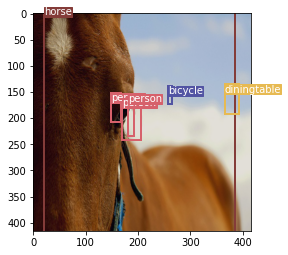

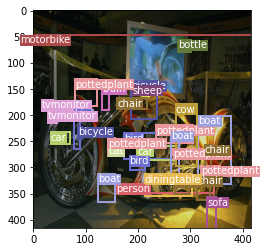

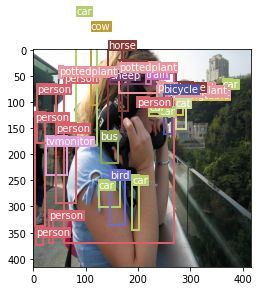

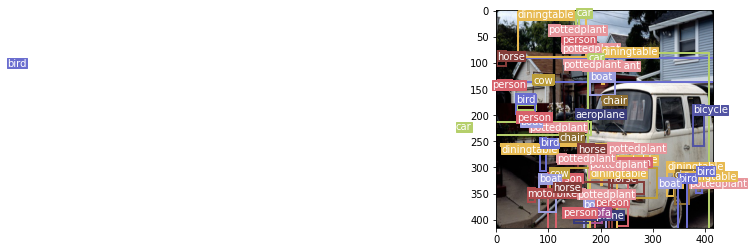

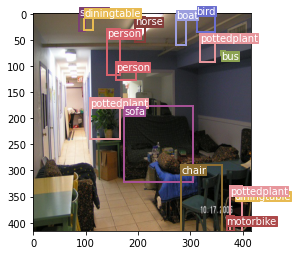

In [41]:
for step, (x, y) in enumerate(train_data):
  for i in range(x.shape[0]):
    selected_boxes = []
    for detections in pred_box:
      if detections[0] == (step * batch_size + i):
        selected_boxes.append(detections[1:])
    plot_image(x[i], selected_boxes)

In [28]:
mean_average_precision(pred_box, true_box, 0.5, 'different')

0.15747826584418745

[[14.0, 1.0, 0.7360000014305115, 0.5560000538825989, 0.30800002813339233, 0.8560000658035278], [13.0, 1.0, 0.48100000619888306, 0.6666666865348816, 0.5100000500679016, 0.5173333287239075]]


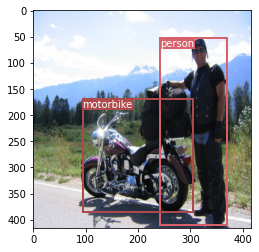

In [37]:
# Checking the output of the ground images to check if the image is correct and the bounding boxes are good
for step, (x_batch_test, y_batch_test) in enumerate(train_data):
  scale_1 = tf.convert_to_tensor(y_batch_test['output_1'], dtype=tf.float32)
  scale_2 = tf.convert_to_tensor(y_batch_test['output_2'], dtype=tf.float32)
  scale_3 = tf.convert_to_tensor(y_batch_test['output_3'], dtype=tf.float32)
  batch_size = x_batch_test.shape[0]
  true_bboxes = [[] for _ in range(batch_size)]
  pred_bboxes = [[] for _ in range(batch_size)]
  nms_treated_boxes = []
  for i in range(3):
    index = 'output_' + str(i+1)
    true_boxes = cells_to_bboxes(tf.convert_to_tensor(y_batch_test[index], dtype=tf.float32), scaled_anchors[i], S[i], is_preds=False)
    for idx, (box) in enumerate(true_boxes):
      true_bboxes[idx] += box

  t = tf.convert_to_tensor(true_bboxes, dtype=tf.float32)
  filt_4 = t[25,:,1] == 1
  t_conv = t[25,:,:][filt_4].tolist()
  print(t_conv)
  plot_image(x_batch_test[25].numpy(), t_conv)
  break